<a href="https://colab.research.google.com/github/suptechlab/Data-Gymnasium/blob/main/notebooks/M2_3_Liberating_data_from_PDFs_via_table_extraction_using_computer_vision_and_OCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# M2.3 Liberating data from PDFs via table extraction using computer vision and OCR

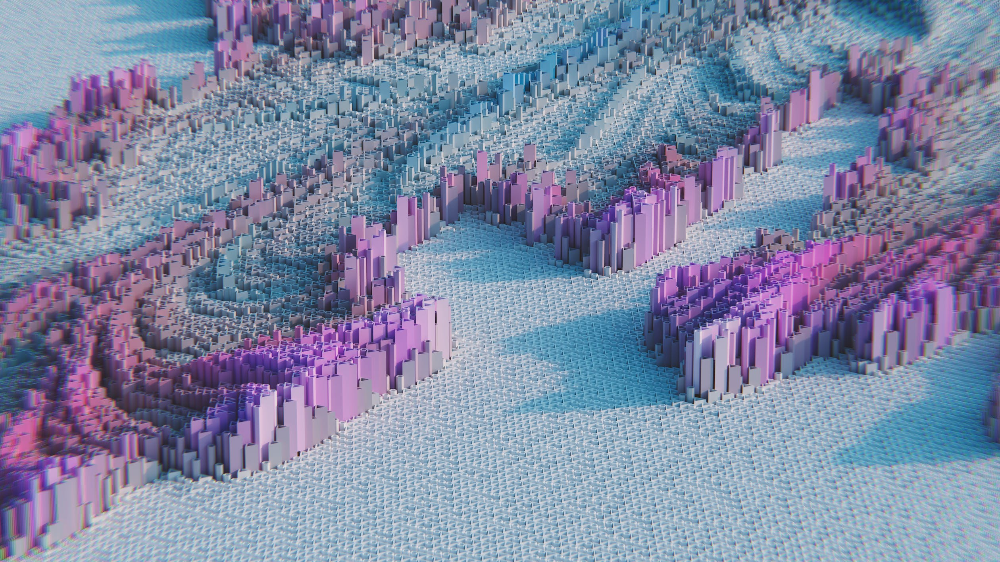

## Disclaimer

-----------------------------------------------------------------------------------------
**This data science notebook is provided for educational purposes only.**

It contains code, analysis, and models that are intended to serve as learning materials and examples. The content is not intended for direct deployment to production environments.

You are encouraged to adapt and modify the contents of this notebook in accordance with the license provided in the associated github repository. However, it is essential to exercise caution, further development, and thorough testing before considering any deployment to production systems.

The authors and contributors of this notebook assume no liability for any consequences, including financial or operational, resulting from the use or misuse of the information and code provided herein. Always consult with appropriate experts and conduct rigorous testing and validation before applying any techniques or models in a real-world, production context.

**By using this notebook, you agree to these terms and conditions.**

-----------------------------------------------------------------------------------------


## Content

PDF extraction is of paramount importance for financial supervisors due to the widespread use of PDF format in the financial industry. Financial supervisors have historically received a multitude of reports, statements, and documents in PDF form across various supervisory areas. However, the critical data contained within these files often remains locked away, making it challenging to analyze, monitor, and ensure compliance.

PDF extraction technology empowers financial supervisors to efficiently unlock and extract vital information from these documents. This capability not only streamlines data processing but also enhances regulatory oversight, risk management, and decision-making processes, ultimately ensuring the integrity and transparency of the financial sector.

## Resources and acknowledgements

The work on table extractions were based entirely on the camelot library's [excellent online documentation](https://camelot-py.readthedocs.io/en/master/index.html), including their [comparison with tabula-py and other similar libraries](https://github.com/camelot-dev/camelot/wiki/Comparison-with-other-PDF-Table-Extraction-libraries-and-tools)

The pdf for our "mobile money tarriff extraction" case study was [publicly available online](https://www.airtel.co.zm/assets/pdf/AIRTEL-Tariff-Guide-Poster-A1.pdf) on Airtel's website.

The dataset for our "quarterly statements extraction" case study was also [publicly available online](https://www.bayer.com/sites/default/files/2023-05/bayer-quarterly-statement-q1-2023.pdf) on Bayer's website.

Both were saved to a public location on Google Drive for the sake of continuity of this notebook.

## Defining our target

First we will consider two typical scenarios where financial supervisors need to delve into:

1. Mobile money tariff sheet table

  Extracting data from a mobile money tariff sheet enables market conduct supervisors to closely monitor pricing structures, transaction fees, and customer charges, ensuring fair practices within the mobile financial services sector.

2. Quarterly financial statement

  Extracting information from quarterly financial statements allows supervisors to gauge the financial health of institutions, assess risk exposure, and track compliance with capital adequacy requirements.

The process and tools involved in extracting text from these documents encompass a wide range of functionalities that hold substantial relevance for numerous supervisory use cases. Together, these examples highlight the versatility of PDF extraction tools in addressing the multifaceted data needs of financial supervisors across diverse domains.

Finally, we will review how some of this technology looks under the hood, and some tools to explore independently that can help with more advanced cases such as extracting handwritten text.

## Installing and importing libraries

In [2]:
# Install tesseract
!sudo apt install tesseract-ocr
!pip install pytesseract

# Install pdf tools
!pip install pymupdf # referred to as fitz in code for legacy reasons
!pip install camelot-py

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 18 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (4,633 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [3]:
import fitz
import camelot

import urllib
import requests
import io

import numpy as np
import pandas as pd

import cv2
from imutils import contours
from google.colab.patches import cv2_imshow

import pytesseract

# Case 1: Automating extraction from indexed pdf

In this case, we will be taking a look at teh following:

* Extracting structured data (tables) using `camelot-py`
* Extracting & parsing unstructured data (text) using `PyMuPDF`

As an optional further exercise, you can also refer to the M2.2 in the Lab's Data Gymnasium for a deeper dive into how to the outputs of unstructured data to observe trends, sentiments, and topics

## Mobile Money Tariffs

### Getting the data

In [185]:
# Airtel Tariffs
# From: https://www.airtel.co.zm/assets/pdf/AIRTEL-Tariff-Guide-Poster-A1.pdf
# Saved on 7 Oct
file = 'https://storage.googleapis.com/suptech-lab-practical-data-science-public/AIRTEL-Tariff-Guide-Poster-A1.pdf'
pages = '1'

tables = camelot.read_pdf(file, pages=pages, flavor='stream', row_tol=20, strip_text='\n')

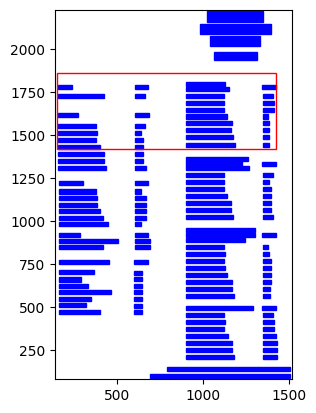

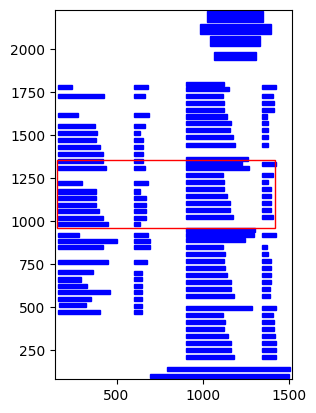

In [186]:
camelot.plot(tables[0], kind='contour').show()
camelot.plot(tables[1], kind='contour').show()

### Preprocessing the data

In [6]:
corners = [
    # First column
    '0,1850,750,1650',
    '0,1650,750,1260',
    '0,1260,750,950',
    '0,950,750,800',
    '0,800,750,400',

    # Second column
    '750,1850,1500,1400',
    '750,1400,1500,980',
    '750,980,1500,550',
    '750,550,1500,150'
]
tables = camelot.read_pdf(file, pages=pages, flavor='stream', table_areas=corners)

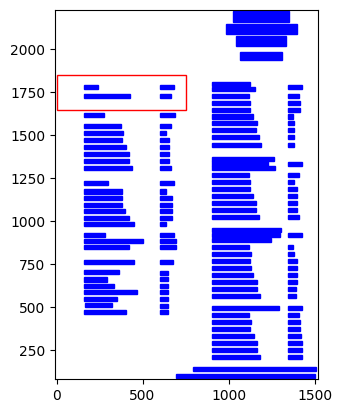

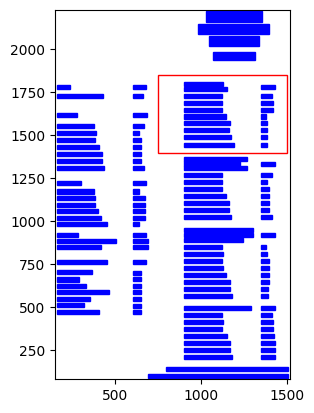

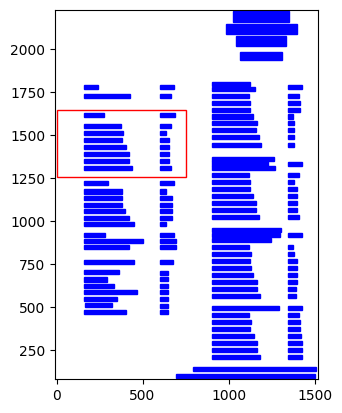

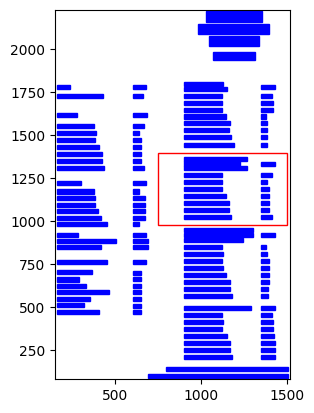

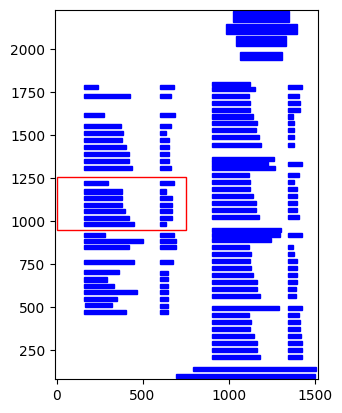

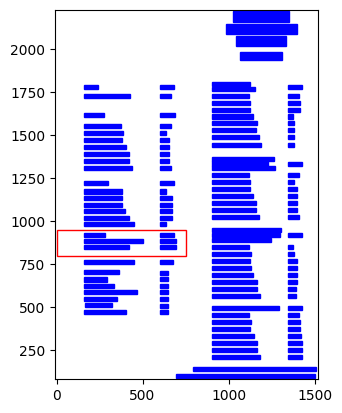

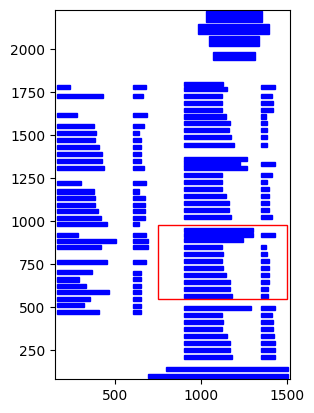

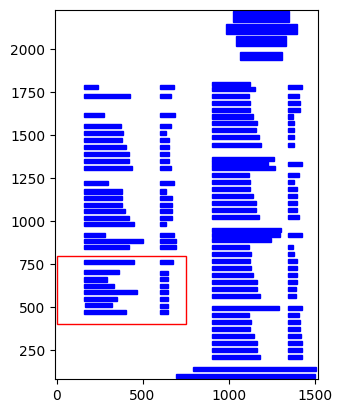

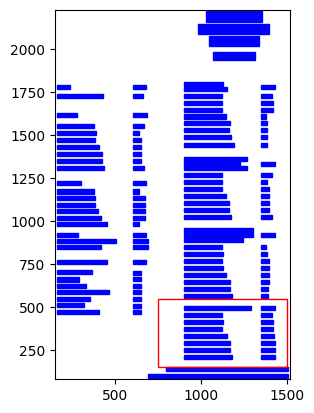

In [7]:
for table in tables:
  camelot.plot(table, kind='contour').show()

### Evaluating our approach

In [8]:
dfs = []
for table in tables:
    df = table.df
    df.columns = df.iloc[0]  # use first row as header
    df = df[1:]  # remove the first row from the dataframe
    dfs.append(df)

dfs[2]

,Withdrawal,Charge
1,Between K1 to K150,K2.50
2,Above K150 to K300,K5
3,Above K300 to K500,K10
4,"Above K500 to K1,000",K20
5,"Above K1,000 to K3,000",K30
6,"Above K3,000 to K5,000",K50
7,"Above K5,000 to K10,000",K100


## Quarterly Statements

### Getting the data

In [53]:
# Bayer quarterly statements
# From https://www.jpmorganchase.com/content/dam/jpmc/jpmorgan-chase-and-co/investor-relations/documents/quarterly-earnings/2023/2nd-quarter/fc5019d6-4433-4a61-a340-a9cb89c4c7e1.pdf
# Saved on 7 Oct 2023
file = 'https://storage.googleapis.com/suptech-lab-practical-data-science-public/jpmc-quarterly-statement.pdf'
pages = '2'

corners = [
    '0,640,600,460',
]

# flag_size because the document contains some superscripts: https://camelot-py.readthedocs.io/en/master/user/advanced.html#flag-superscripts-and-subscripts
tables = camelot.read_pdf(file, pages=pages, flavor='stream', table_areas=corners, flag_size=True)

### Processing the data

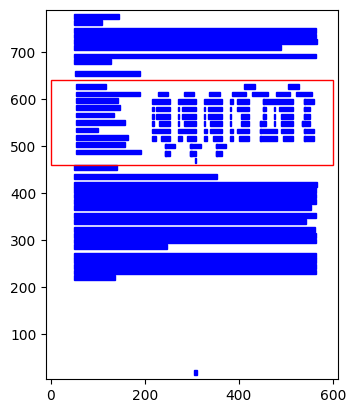

In [14]:
camelot.plot(tables[0], kind='contour').show()

### Evaluating our approach

In [16]:
dfs = []
for table in tables:
    df = table.df
    df.columns = df.iloc[0]  # use first row as header
    df = df[1:]  # remove the first row from the dataframe
    dfs.append(df)

dfs[0]

,Results for JPM,,,,,1Q23,2Q22,
1,"($ millions, except per share data)",2Q23,1Q23,2Q22,,$ O/(U),O/(U) %\n$ O/(U),O/(U) %
2,Net revenue - reported,,,,,,,
3,,"$ 41,307","$ 38,349","$ 30,715",$,"2,958","8 % $ 10,592",34 %
4,Net revenue - managed,,,,,,,
5,,"42,401","39,336","31,630",,"3,065","8 \n \n10,771",34
6,Noninterest expense,,,,,,,
7,,"20,822","20,107","18,749",,715,"4 \n \n2,073",11
8,Provision for credit losses,,,,,,,
9,,"2,899","2,275","1,101",,624,"27 \n \n1,798",163
10,Net income,,,,,,,


Fine tuning the columns, characters, and rows:

In [184]:
col_xs = ['200,260,320,370,430,490,527,550']

# Grab the header first, including special characters
tables = camelot.read_pdf(file, pages=pages, flavor='stream', table_areas=corners,
                          row_tol=10, columns=col_xs, flag_size=True)
df = tables[0].df

# Grab the table body with special characters removed
tables = camelot.read_pdf(file, pages=pages, flavor='stream', table_areas=corners,
                          row_tol=10, columns=col_xs, strip_text=["\n","$","%"], flag_size=True)

df2 = tables[0].df
df2 = df2[3:] # remove the first rows from the dataframe, which we don't need
df2.columns = df.iloc[1] # set the column headers

df2

1,"($ millions, except per share data)",2Q23,1Q23,2Q22,$ O/(U),O/(U) %,$ O/(U),O/(U) %,
3,Net revenue - managed,"42,401","39,336","31,630","3,065",8,"10,771",34,
4,Noninterest expense,"20,822","20,107","18,749",715,4,"2,073",11,
5,Provision for credit losses,"2,899","2,275","1,101",624,27,"1,798",163,
6,Net income,"14,472","12,622","8,649","1,850",15,"5,823",,67
7,Earnings per share - diluted,4.75,4.10,2.76,0.65,16,1.99,,72
8,Return on common equity,20,18,13,,,,,
9,Return on tangible common equity,25,23,17,,,,,


# Case 2: Under the hood with extraction for unindexed pdfs

Liberating data from an unindexed pdf follows the general process:

* Converting to image (PyPDF2 to extact page as image)
* Identifiying tabular cells in image (https://stackoverflow.com/a/59619675)
* Converting cells to text (https://stackoverflow.com/questions/37745519/use-pytesseract-ocr-to-recognize-text-from-an-image)

Video here: https://livefiredev.com/how-to-extract-table-from-image-in-python-opencv-ocr/

### Get the data

In [187]:
# Load the pdf into our notebook
# From: https://raw.githubusercontent.com/atlanhq/camelot/master/docs/benchmark/lattice/agstat/agstat.pdf
# Saved on 7 Oct
request = requests.get("https://storage.googleapis.com/suptech-lab-practical-data-science-public/agstat.pdf")
filestream = io.BytesIO(request.content)

### Preprocess the data

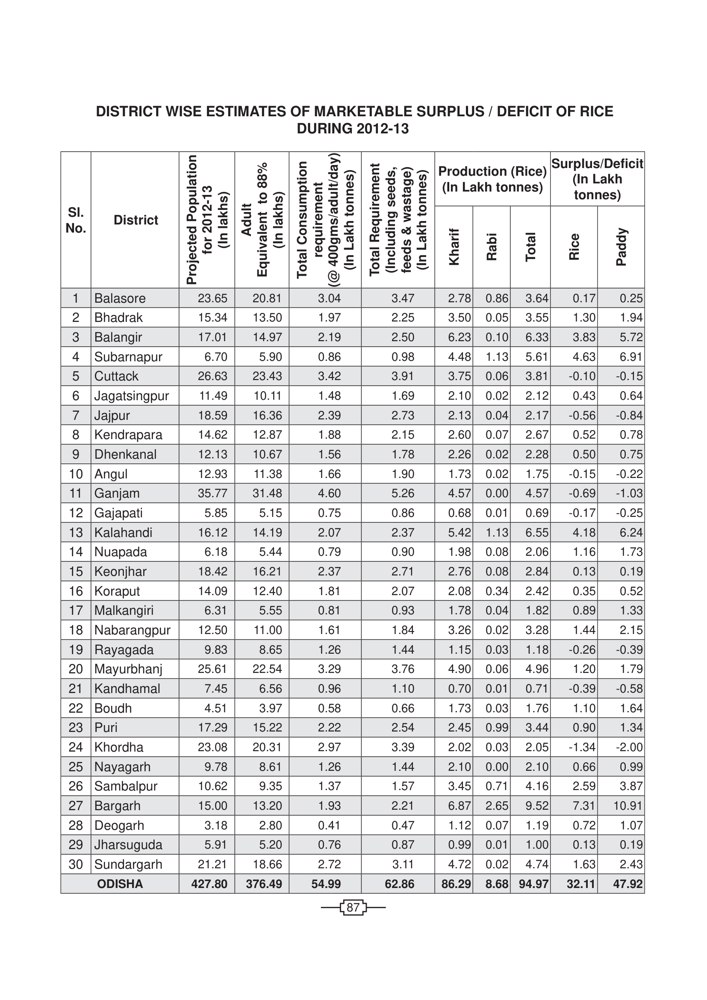

In [ ]:
# Open a stream of the file
pdf = fitz.open(stream=filestream, filetype="pdf")

# Get text contents of doc
pdf_contents = ""
for page in pdf:
  pdf_contents += page.get_text()

# Extract the page with the table that we want
page = pdf.load_page(0)  # number of page

# Convert the page to an image
pix = page.get_pixmap(dpi=200) # pay attention to dpi as part of streaming!
pix.save('table.png')

# Close the stream of the file
pdf.close()

cv2_imshow(cv2.imread('table.png'))

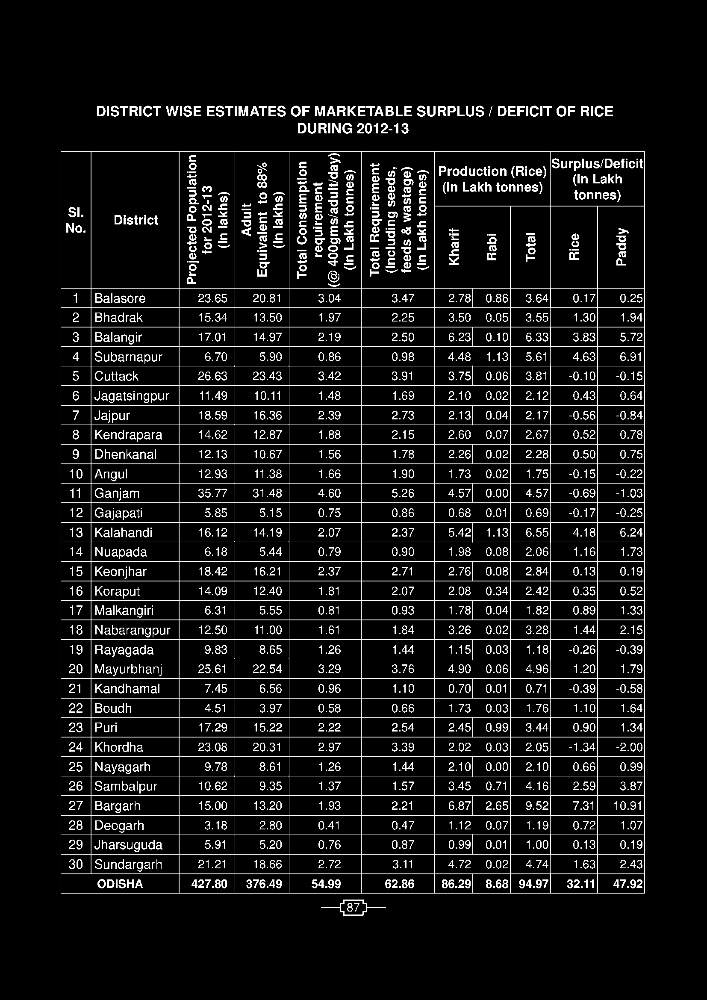

In [ ]:
# Load image, grayscale, Otsu's threshold

# For local file
image = cv2.imread('table.png')

original = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

cv2_imshow(thresh)

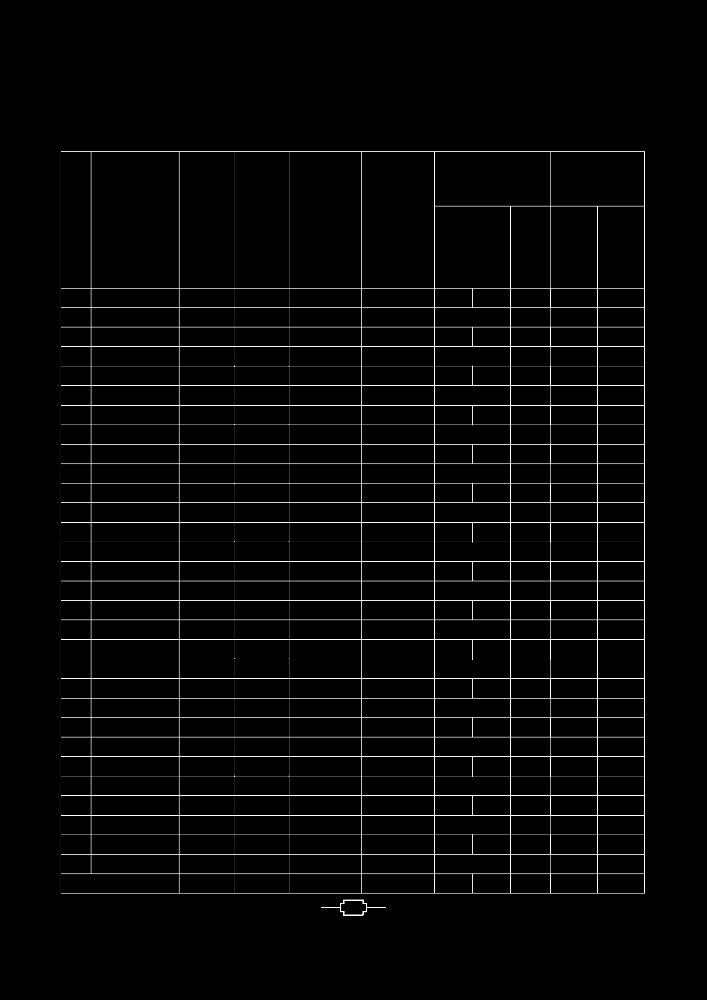

In [ ]:
# Remove text characters with morph open and contour filtering
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,1))
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
cnts = cv2.findContours(opening, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 500:
        cv2.drawContours(opening, [c], -1, (0,0,0), -1)

cv2_imshow(opening)

### Set up our model

In [ ]:
# Repair table lines, sort contours, and extract ROI
close = 255 - cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=1)
cnts = cv2.findContours(close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
(cnts, _) = contours.sort_contours(cnts, method="top-to-bottom")

## Test our model

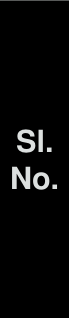

Sl.



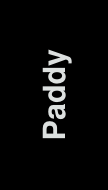

Apped



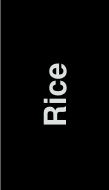

ater)



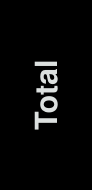

[e}0]



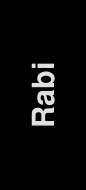

Rabi



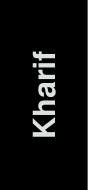

Pro AeDe



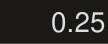

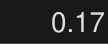

m4



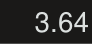

RAory



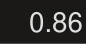

OR si2}



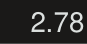

2.78



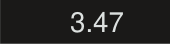

Revs



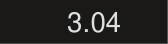

3.04



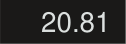

20.81



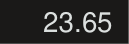

Px Role)



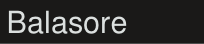

Balasore



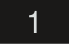

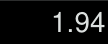

eer



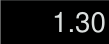

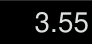

3.55



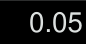

0.05



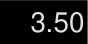

3.50



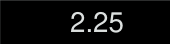

2.25



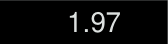

ey



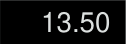

13.50



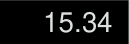

15.34



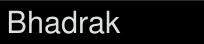

Bhadrak



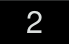

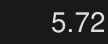

we



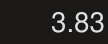

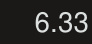

oR)



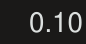

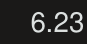

6.23



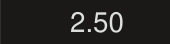

2.50



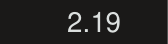

2.19



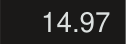

Rr



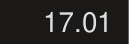

WAC)



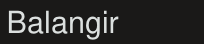

Balangir



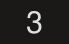

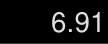

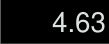

4.63



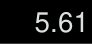

5.61



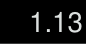

ak)



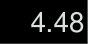

Zs}



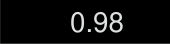

ORI}



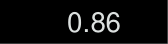

0.86



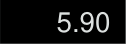

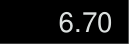

6.70



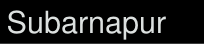

Subarnapur



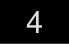

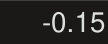

-0.15



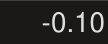

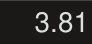

Ron



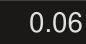

len el)



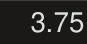

3.75



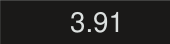

3.91



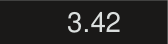

3.42



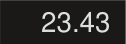

PR)



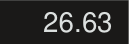

PAR)



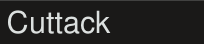

Cuttack



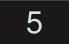

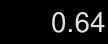

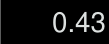

0.43



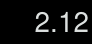

Par



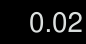

ene



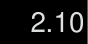

2.10



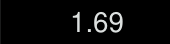

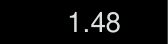

1.48



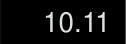

cea



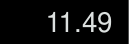

11.49



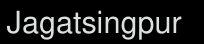

Jagatsingpur



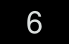

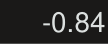

-0.84



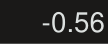

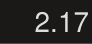

PmWA



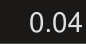

ener



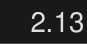

2.13



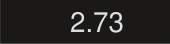

2.73



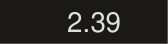

2.39



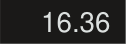

16.36



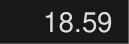

18.59



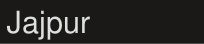

NET olelg



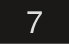

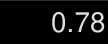

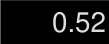

0.52



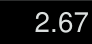

PAYA



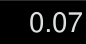

eneY4



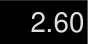

2.60



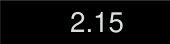

2.15



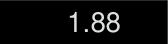

1.88



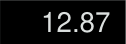

Ry



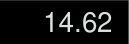

ry



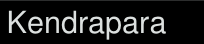

Kendrapara



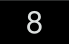

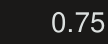

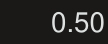

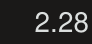

2.28



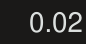

ene



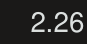

2.26



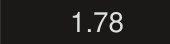

1.78



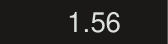

1.56



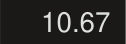

seh y4



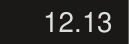

12.13



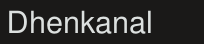

Dhenkanal



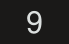

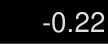

en



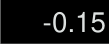

-0.15



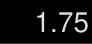

1.75



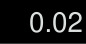

ene



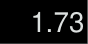

1.73



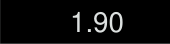

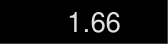

1.66



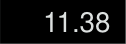

11.38



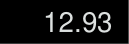

12.93



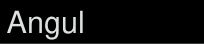

Angul



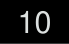

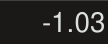

Sunes)



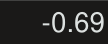

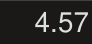

4.57



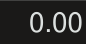

0.00



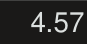

4.57



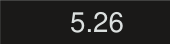

5.26



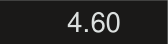

4.60



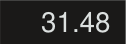

31.48



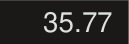

35.77



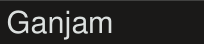

(CET EU



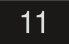

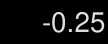

-0.25



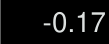

ems



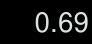

0.69



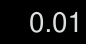

0.01



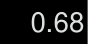

OA sts)



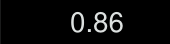

0.86



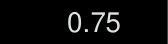

0.75



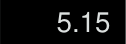

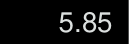

5.85



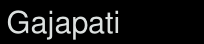

Gajapati



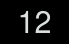

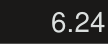

we



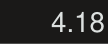

4.18



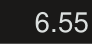

lool)



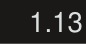

ak)



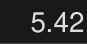

tomer



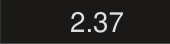

2.37



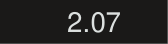

PAYA



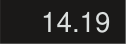

14.19



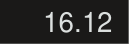

tomar



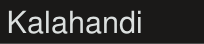

Kalahandi



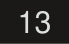

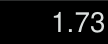

1.73



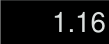

al)



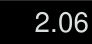

2.06



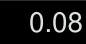

lon els)



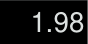

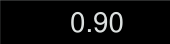

0.90



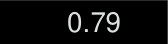

0.79



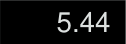

wel



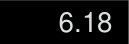

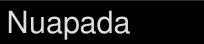

Nuapada



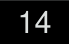

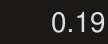

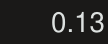

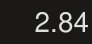

PRT



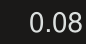

0.08



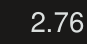

2.76



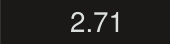

2.71



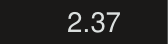

PTA



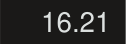

stow



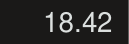

18.42



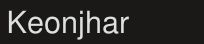

Keonjhar



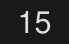

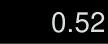

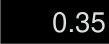

0.35



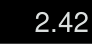

Pa



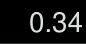

0.34



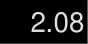

2.08



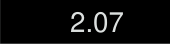

PAs



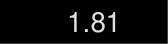

|



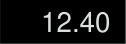

12.40



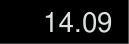

14.09



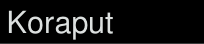

Koraput



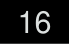

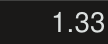

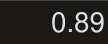

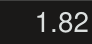

R34



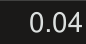

ener



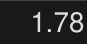

1.78



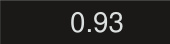

ORK)



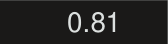

0.81



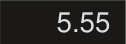

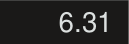

6.31



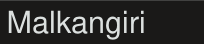

Malkangiri



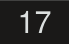

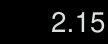

2.15



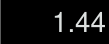

roc



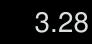

3.28



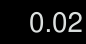

ene



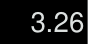

3.26



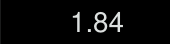

ero



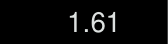

Ro!



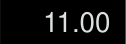

11.00



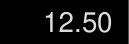

12.50



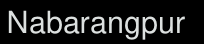

Nabarangpur



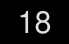

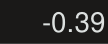

-0.39



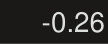

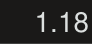

1.18



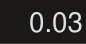

0.03



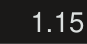

1.15



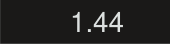

rc



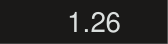

1.26



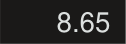

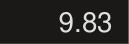

9.83



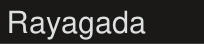

Rayagada



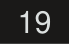

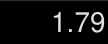

1.79



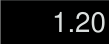

40)



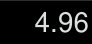

4.96



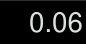

Lonel)



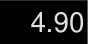

4.90



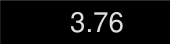

3.76



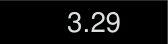

3.29



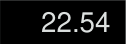

ee



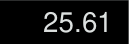

25.61



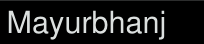

Mayurbhanj



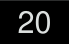

20



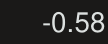

-0.58



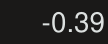

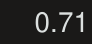

0.71



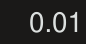

0.01



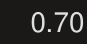

0.70



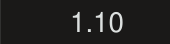

1.10



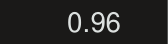

ORT)



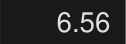

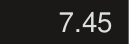

7.45



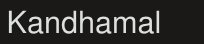

Kandhamal



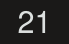

Pa



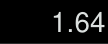

er



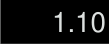

1.10



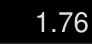

1.76



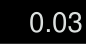

0.03



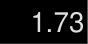

1.73



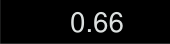

0.66



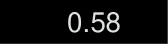

0.58



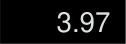

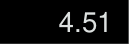

4.51



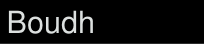

Boudh



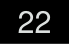

ee)



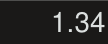

cr



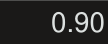

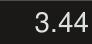

Cel



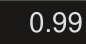

0.99



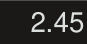

2.45



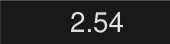

eae



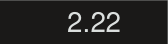

ear



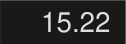

15.22



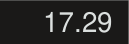

17.29



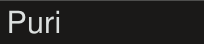

Puri



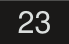

23



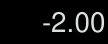

-2.00



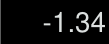

meer



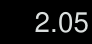

2.05



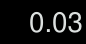

0.03



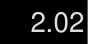

pay



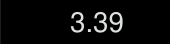

RECK)



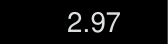

PATA



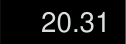

20.31



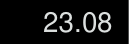

23.08



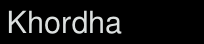

Khordha



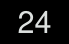

ea



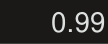

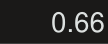

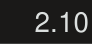

2.10



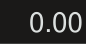

len e]0)



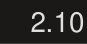

2.10



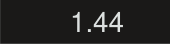

rc



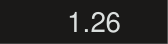

1.26



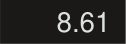

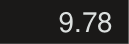

9.78



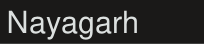

Nayagarh



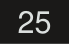

25



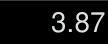

RR¥4



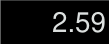

2.59



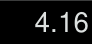

4.16



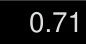

0.71



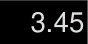

3.45



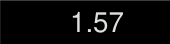

evs



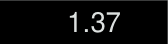

rs



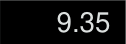

9.35



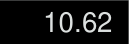

10.62



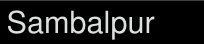

Sambalpur



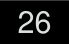

26



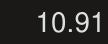

sTORS)|



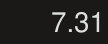

7.31



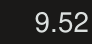

9.52



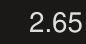

2.65



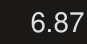

6.87



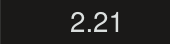

ara



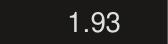

1.93



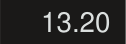

13.20



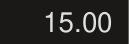

15.00



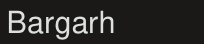

Bargarh



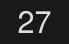

ead



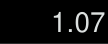

ners



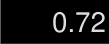

re



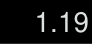

1.19



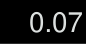

ener 4



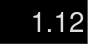

iar



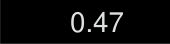

RTA



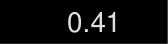

OFA



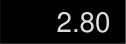

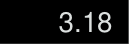

3.18



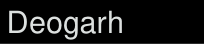

Deogarh



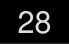

28



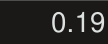

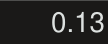

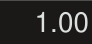

1.00



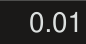

0.01



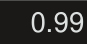

0.99



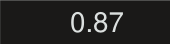

0.87



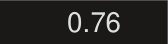

LOR As)



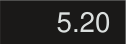

5.20



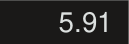

Lome)



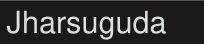

Jharsuguda



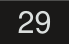

29



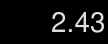

2.43



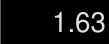

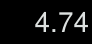

Ce



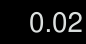

ene



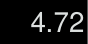

Ce



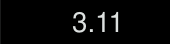

cmb



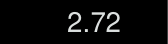

ea



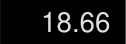

18.66



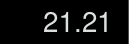

21.21



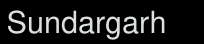

Sundargarh



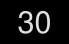

30



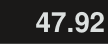

Ce:



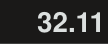

32.11



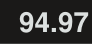

Ter



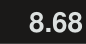

Ast)



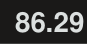

ts] e72:)



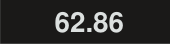

62.86



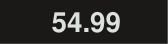

54.99



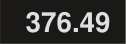

YAR)



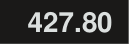

427.80



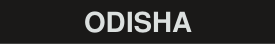

ODISHA



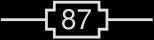

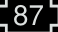

In [ ]:
for c in cnts:
    area = cv2.contourArea(c)
    if area < 25000:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), -1)
        ROI = original[y:y+h, x:x+w] # Region Of Interest
        ROItoconvert = 255 - ROI

        # Visualization
        cv2_imshow(ROItoconvert)
        cv2.waitKey(20)
        data = pytesseract.image_to_string(ROItoconvert, lang='eng')
        print(data)

# Areas for further exploration

* Improve the classification of the extracted cells using, e.g., convolutional neural networks instead of py-tesseract library
* Add in support for handwritten digits